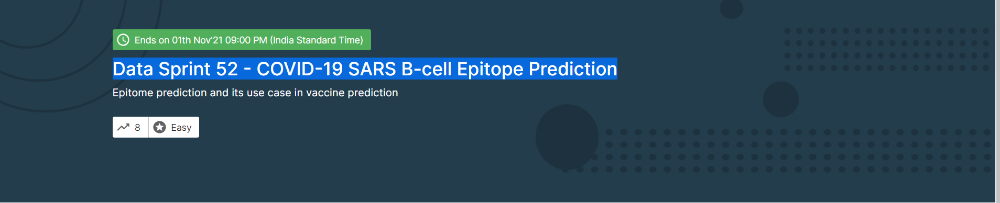

## About the data
Due to the spread of COVID-19, vaccine development is being demanded as soon as possible. Despite the importance of data analysis in vaccine development - the B-cell epitope predictions covered in this dataset is one of the key research topics in vaccine development. This dataset was developed during the research process and the data was obtained from IEDB and UniProt. Predicting epitope regions is beneficial for the design and development of vaccines aimed to induce antigen-specific antibody production. This dataset has 14387 rows for all combinations of 14362 peptides and 757 proteins.

## Problem Statement

Predicting epitope regions in order to help the development of vaccines aimed to induce antigen-specific antibody production.

## Traget Data

* Target variable: **0** represents the independent feature combination is **not antibody valence** and **1** represents the independent feature combination is an **antibody valence**.

## Import Required Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
from google.colab import files
files.upload()

Saving testing_data.csv to testing_data.csv
Saving training_data.csv to training_data.csv


{'testing_data.csv': b'parent_protein_id,protein_seq,start_position,end_position,peptide_seq,chou_fasman,emini,kolaskar_tongaonkar,parker,isoelectric_point,aromaticity,hydrophobicity,stability\nP40136,MTRNKFIPNKFSIISFSVLLFAISSSQAIEVNAMNEHYTESDIKRNHKTEKNKTEKEKFKDSINNLVKTEFTNETLDKIQQTQDLLKKIPKDVLEIYSELGGEIYFTDIDLVEHKELQDLSEEEKNSMNSRGEKVPFASRFVFEKKRETPKLIINIKDYAINSEQSKEVYYEIGKGISLDIISKDKSLDPEFLNLIKSLSDDSDSSDLLFSQKFKEKLELNNKSIDINFIKENLTEFQHAFSLAFSYYFAPDHRTVLELYAPDMFEYMNKLEKGGFEKISESLKKEGVEKDRIDVLKGEKALKASGLVPEHADAFKKIARELNTYILFRPVNKLATNLIKSGVATKGLNVHGKSSDWGPVAGYIPFDQDLSKKHGQQLAVEKGNLENKKSITEHEGEIGKIPLKLDHLRIEELKENGIILKGKKEIDNGKKYYLLESNNQVYEFRISDENNEVQYKTKEGKITVLGEKFNWRNIEVMAKNVEGVLKPLTADYDLFALAPSLTEIKKQIPQKEWDKVVNTPNSLEKQKGVTNLLIKYGIERKPDSTKGTLSNWQKQMLDRLNEAVKYTGYTGGDVVNHGTEQDNEEFPEKDNEIFIINPEGEFILTKNWEMTGRFIEKNITGKDYLYYFNRSYNKIAPGNKAYIEWTDPITKAKINTIPTSAEFIKNLSSIRRSSNVGVYKDSGDKDEFAKKESVKKIAGYLSDYYNSANHIFSQEKKRKISIFRGIQAYNEIENVLKSKQIAPEYKNYFQYLKERITNQVQLLLTHQKSNIEFKLLYKQLNFTENETDNFEVFQKIIDE

In [4]:
import shutil
shutil.copy ("/content/testing_data.csv","/content/drive/MyDrive/dphi/SarsB")
shutil.copy ("/content/training_data.csv","/content/drive/MyDrive/dphi/SarsB")

'/content/drive/MyDrive/dphi/SarsB/training_data.csv'

In [5]:
train = pd.read_csv("/content/training_data.csv")
test = pd.read_csv("/content/testing_data.csv")

In [6]:
train.head()

,parent_protein_id,protein_seq,start_position,end_position,peptide_seq,chou_fasman,emini,kolaskar_tongaonkar,parker,isoelectric_point,aromaticity,hydrophobicity,stability,target
0,P05014,MALSFSLLMAVLVLSYKSICSLGCDLPQTHSLGNRRALILLAQMGR...,60,72,GFPEEEFDGHQFQ,1.002,1.770,0.972,2.569,5.764099,0.095238,-0.169841,56.522222,1
1,P09012,MAVPETRPNHTIYINNLNEKIKKDELKKSLYAIFSQFGQILDILVS...,28,35,KSLYAIFS,0.916,0.232,1.084,-0.938,9.831604,0.070922,-0.438652,56.528050,0
2,Q16533,MGTPPGLQTDCEALLSRFQETDSVRFEDFTELWRNMKFGTIFCGRM...,274,288,IQASKSRRHRQVKLD,0.955,1.271,1.024,2.820,9.526794,0.081522,-0.826087,41.752174,0
3,P18012,MEIQNTKPTQTLYTDISTKQTQSSSETQKSQNYQQIAAHIPLNVGK...,345,352,SINQSKNS,1.234,1.537,0.961,4.650,7.830627,0.016529,-0.440496,45.818182,0
4,P37592,MKLKLVAVAVTSLLAAGVVNAAEVYNKDGNKLDLYGKVHAQHYFSD...,100,108,FAGLKFADY,0.920,0.302,1.043,-0.433,4.660217,0.146409,-0.457735,8.855801,1


In [8]:
train.describe()

,start_position,end_position,chou_fasman,emini,kolaskar_tongaonkar,parker,isoelectric_point,aromaticity,hydrophobicity,stability,target
count,11509.000000,11509.000000,11509.000000,11509.000000,11509.000000,11509.000000,11509.000000,11509.000000,11509.000000,11509.000000,11509.000000
mean,296.243809,306.638891,0.994090,1.047584,1.021535,1.762720,7.073158,0.075473,-0.410324,43.886292,0.271179
std,351.356559,351.347974,0.124569,1.594784,0.054140,1.974823,1.897779,0.025834,0.395872,16.744727,0.444588
min,1.000000,6.000000,0.534000,0.000000,0.849000,-9.029000,3.686096,0.000000,-1.971171,5.448936,0.000000
25%,84.000000,94.000000,0.911000,0.246000,0.987000,0.592000,5.621033,0.060268,-0.606215,31.614529,0.000000
50%,191.000000,200.000000,0.989000,0.549000,1.020000,1.800000,6.519104,0.073705,-0.330540,42.287268,0.000000
75%,381.000000,391.000000,1.073000,1.195000,1.055000,3.000000,8.676575,0.091312,-0.189591,49.101172,1.000000
max,3021.000000,3033.000000,1.503000,27.189000,1.255000,9.120000,12.232727,0.182254,1.267089,137.046667,1.000000


In [9]:
train.describe(include='O')

,parent_protein_id,protein_seq,peptide_seq
count,11509,11509,11509
unique,686,684,11492
top,P10155,MEESVNQMQPLNEKQIANSQDGYVWQVTDMNRLHRFLCFGSEGGTY...,ARDVLAVVSK
freq,443,443,3


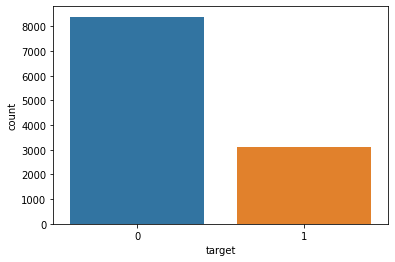

In [11]:
sns.countplot(x='target',data=train)

In [12]:
cat_cols = [col for col in train.columns if train[col].dtypes == 'O']

In [13]:
cat_cols

['parent_protein_id', 'protein_seq', 'peptide_seq']

In [15]:
for col in cat_cols :
  print(train[col].nunique())

686
684
11492


In [16]:
train.shape

(11509, 14)

In [17]:
!pip install catboost

     |████████████████████████████████| 76.3 MB 29 kB/s 


In [18]:
from catboost import CatBoostClassifier
from sklearn.metrics import *
from sklearn.model_selection import *
#
from hyperopt import hp, fmin, tpe, Trials
from hyperopt.pyll.base import scope
from functools import partial
from sklearn.metrics import f1_score
#
from sklearn.model_selection import StratifiedKFold

In [19]:
X = train.drop('target',axis=1)
Y = train['target']

## Train_test_split

In [23]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.10,stratify=Y,random_state=42)

## Model Training

In [24]:
model = CatBoostClassifier(max_depth=3,
                                   learning_rate = 0.001,
                                   random_state=70,
                                   eval_metric='AUC',
                                   auto_class_weights='Balanced',
                                   num_boost_round=2000,verbose=0)
model.fit(X_train,y_train,cat_features=cat_cols)
            

In [25]:
y_pred = model.predict(X_test)

## Confusion Matrix

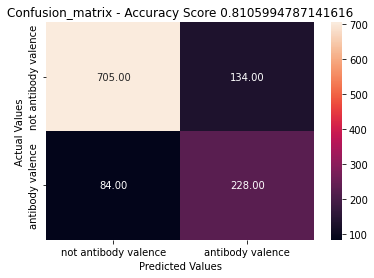

In [27]:
from sklearn.metrics import confusion_matrix,accuracy_score
cf = confusion_matrix(y_test,y_pred)
accuracy = accuracy_score(y_test,y_pred)
sns.heatmap(cf,annot=True,fmt='.2f',xticklabels=['not antibody valence','antibody valence'],yticklabels=['not antibody valence','antibody valence'])
plt.title(f"Confusion_matrix - Accuracy Score {accuracy}")
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

## Cross Validation - StratifiedKFold

Running 1 iteration
0.707185628742515
0.7028315946348733
Running 2 iteration
0.6991488112709129
0.6943300601837187
Running 3 iteration
0.6938286399041341
0.7018961765620143
Running 4 iteration
0.711380880121396
0.7057756274569096
Running 5 iteration
0.7024419656315949
0.7070518794656725
-----------KFOLD--------------
AxesSubplot(0.125,0.125;0.775x0.755)
0.8218940052128584 0.8361140076468544 0.8296986857931641


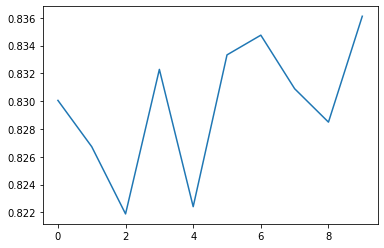

In [59]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
iterations = 5
scores = []
scores_val = []
target = Y
temp = X
predictions = []
for i in range(iterations):
    print(f'Running {i+1} iteration')
    
    kfold = StratifiedKFold(n_splits = 2, shuffle=True)
    
    for train_index,test_index in kfold.split(temp,target):
        xtrain,xtest = temp[temp.index.isin(train_index)],temp[temp.index.isin(test_index)]
        ytrain,ytest = target[train_index],target[test_index]
        
        #model  = CatBoostClassifier(learning_rate = 0.04627007502666947, n_estimators =1483, random_state = 60)    
        model = CatBoostClassifier(max_depth=3,
                                   learning_rate = 0.001,
                                   random_state=70,
                                   eval_metric='AUC',
                                   auto_class_weights='Balanced',
                                   num_boost_round=3000,verbose=0)
        model.fit(xtrain,ytrain,cat_features=cat_cols)
            
        preds = model.predict(xtest)
        
        print(f1_score(ytest,preds))
        scores.append(accuracy_score(ytest,preds))
        #
#
#        
print('-----------KFOLD--------------')
print(sns.lineplot(x=[i for i in range(len(scores))],y=scores))
print(min(scores),max(scores),np.mean(scores))


In [55]:
predictions = model.predict(test)

In [56]:
test['target'] = predictions

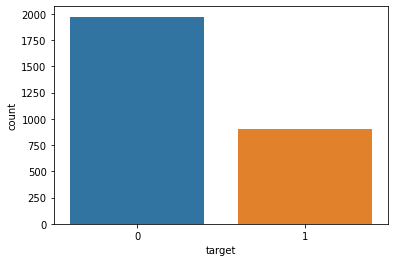

In [57]:
sns.countplot(x='target',data=test)

In [58]:
test[['target']].to_csv('catboost_predictions_4500.csv',index=False)

* with num_boost_round = 2000

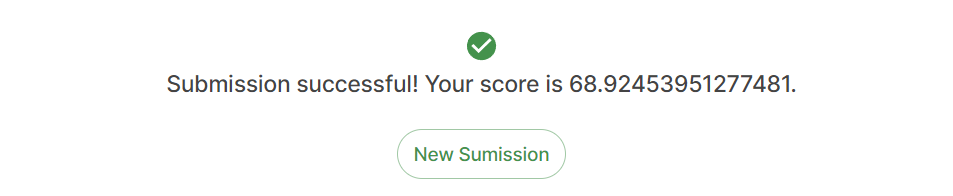

* with num_boost_round = 3000
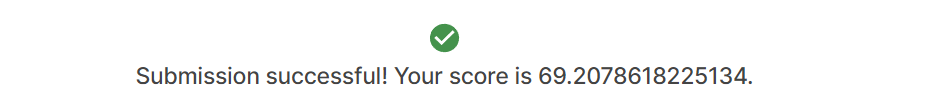

## Explainable AI

In [60]:
!pip install shap

     |████████████████████████████████| 371 kB 8.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for shap: filename=shap-0.40.0-cp37-cp37m-linux_x86_64.whl size=509240 sha256=70b13f7b06cbc3376862ace57927bb2a3c2b46521e015f5b379de5163254d3a5
  Stored in directory: /root/.cache/pip/wheels/ec/35/84/e304841ac4b910bc95fe9a6e5302eb2507b4333728851dcbfb
Successfully built shap


In [61]:
#ignoring all warnings
import warnings
warnings.filterwarnings('ignore')

import shap

# load JS visualization code to notebook. Without this, the SHAP plots won't be displayed
shap.initjs()

In [62]:
# creating an explainer for our model
explainer = shap.TreeExplainer(model)

# finding out the shap values using the explainer
shap_values = explainer.shap_values(X_test)

# Expected/Base/Reference value = the value that would be predicted if we didn’t know any features of the current output”
print('Expected Value:', explainer.expected_value)

# displaying the first 5 rows of the shap values table
pd.DataFrame(shap_values).head()

Expected Value: -0.3950914160281908


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.702267,-0.718740,-0.015962,-0.017297,0.0,-0.006677,0.091476,-0.000798,0.004548,0.008679,-0.005183,-0.004443,0.007049
1,-0.781568,-0.794816,0.003995,0.004718,0.0,-0.006105,0.068129,0.000981,0.003258,-0.010001,0.000848,0.002140,0.011317
2,-0.669321,-0.681066,-0.008448,-0.009158,0.0,-0.003207,0.103899,0.003560,-0.001368,0.008303,0.002132,-0.012989,-0.009821
3,-0.420170,-0.419686,0.001981,0.002505,0.0,-0.010806,-0.072129,0.001558,0.003247,-0.013867,-0.002366,-0.000679,-0.009579
4,0.130923,0.094670,-0.002358,-0.002346,0.0,-0.011856,0.074382,0.002622,0.002590,0.013815,0.000188,0.017009,0.007129


## Force Plot of the 1st row 

In [63]:
X_test.iloc[0]

parent_protein_id                                                 M4NNA6
protein_seq            MSLVNRKQLEKMANVRFRTQEDEYVAILDALEEYHNMSENTVVEKY...
start_position                                                      2197
end_position                                                        2206
peptide_seq                                                   DVYYFGETYT
chou_fasman                                                         1.02
emini                                                              1.211
kolaskar_tongaonkar                                                1.037
parker                                                              1.53
isoelectric_point                                                4.41571
aromaticity                                                     0.119189
hydrophobicity                                                 -0.318259
stability                                                        36.5207
Name: 1294, dtype: object

In [64]:
y_test.iloc[0]

0

In [65]:
shap.initjs()
shap.force_plot(explainer.expected_value,shap_values[0,:], X_test.iloc[0,:])

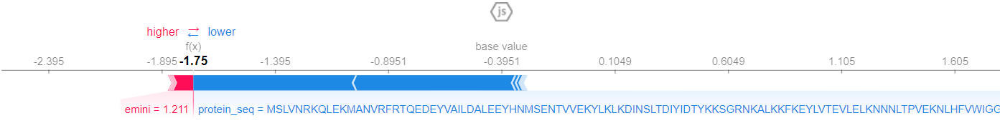

## Force Plot of the 100th  row

In [66]:
X_test.iloc[100]

parent_protein_id                                                 P05164
protein_seq            MGVPFFSSLRCMVDLGPCWAGGLTAEMKLLLALAGLLAILATPQPS...
start_position                                                       289
end_position                                                         298
peptide_seq                                                   PPCFPLKIPP
chou_fasman                                                        1.146
emini                                                              0.382
kolaskar_tongaonkar                                                1.115
parker                                                             -0.88
isoelectric_point                                                9.19391
aromaticity                                                    0.0832215
hydrophobicity                                                 -0.268591
stability                                                        44.6295
Name: 3261, dtype: object

In [67]:
y_test.iloc[100]

0

In [68]:
shap.initjs()
shap.force_plot(explainer.expected_value,shap_values[100,:], X_test.iloc[100,:])

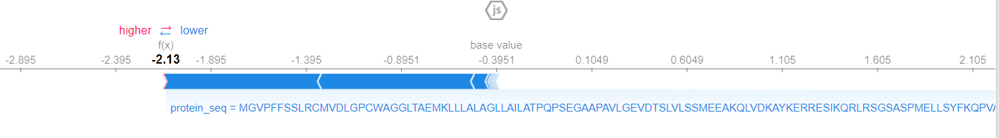

## Feature Importances with SHAP 

* Summary Plot --> This basically takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

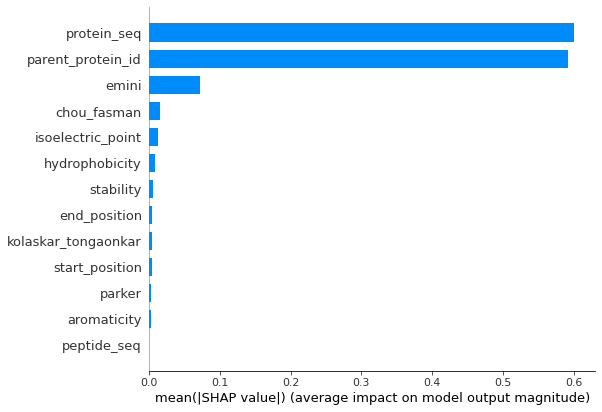

In [69]:
shap.initjs()
shap.summary_plot(shap_values,X_test, plot_type="bar")

* **Summary Plot** - a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset.

* **Features** are sorted by the sum of the SHAP value magnitudes across all samples.

* when the scatter points don’t fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

https://neptune.ai/blog/lightgbm-parameters-guide

## Lightgbm

* With LightGBM you can run different types of Gradient Boosting methods. You have: GBDT, DART, and GOSS which can be specified with the boosting parameter. 

* **lgbm gbdt (gradient boosted decision trees)** used with This method is the traditional Gradient Boosting Decision Tree
* 

## GBDT : Gradient Boosted Decision Tree
It is based on three important principles:

* Weak learners (decision trees) 
* Gradient Optimization 
* Boosting Technique
These trees are built sequentially:

* first tree learns how to fit to the target variable
* second tree learns how to fit to the residual (difference) between the predictions of the first tree and the ground truth
* The third tree learns how to fit the residuals of the second tree and so on.

#### Drawbacks
* main drawback of gbdt is that finding the best split points in each tree node is **time-consuming** and **memory-consuming** operation.

## dart gradient boosting
* DART gradient boosting which is a method that uses  dropout, standard in Neural Networks, to improve model regularization 

* gbdt suffers from over-specialization, which means trees added at later iterations tend to impact the prediction of only a few instances and make a negligible contribution towards the remaining instances. 

* Adding dropout makes it more difficult for the trees at later iterations to specialize on those few samples and hence improves the performance.

In [33]:
from lightgbm import LGBMClassifier